In [11]:
# Install required packages (uncomment if needed)
# !pip install torch torchvision matplotlib

import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import functional as F
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import random

# Set random seed for reproducibility
random.seed(42)
torch.manual_seed(42)

# Check for GPU
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print("Using device:", device)

Using device: cuda


In [12]:
# Define Pascal VOC classes and mapping dictionaries
VOC_CLASSES = (
    "aeroplane", "bicycle", "bird", "boat", "bottle",
    "bus", "car", "cat", "chair", "cow",
    "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor"
)
VOC_CLASS_TO_IDX = {cls: idx+1 for idx, cls in enumerate(VOC_CLASSES)}
IDX_TO_VOC_CLASS = {idx+1: cls for idx, cls in enumerate(VOC_CLASSES)}
print("VOC Classes:", VOC_CLASSES)


VOC Classes: ('aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor')


In [13]:
def plot_image_with_boxes(image, target, prediction=None):
    """
    Display an image with bounding boxes.
    Ground truth boxes (with class names) are drawn in green.
    Predicted boxes (with class names and scores) are drawn in red.
    """
    # Convert tensor image to numpy for display
    img = image.mul(255).permute(1, 2, 0).byte().numpy()
    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img)

    # Plot ground truth boxes in green with labels
    for box, label in zip(target['boxes'].numpy(), target['labels'].numpy()):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='g', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, ymin, IDX_TO_VOC_CLASS.get(label, str(label)),
                color="green", fontsize=10, weight="bold", backgroundcolor="w")

    # Plot predicted boxes in red with labels and scores
    if prediction is not None:
        pred_boxes = prediction['boxes'].detach().cpu().numpy()
        pred_scores = prediction['scores'].detach().cpu().numpy()
        pred_labels = prediction['labels'].detach().cpu().numpy()
        for box, score, label in zip(pred_boxes, pred_scores, pred_labels):
            if score < 0.5:  # filter low confidence predictions
                continue
            xmin, ymin, xmax, ymax = box
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                     linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            label_name = IDX_TO_VOC_CLASS.get(label, str(label))
            ax.text(xmin, ymin, f"{label_name}: {score:.2f}", color="red",
                    fontsize=10, weight="bold", backgroundcolor="w")

    plt.axis('off')
    plt.show()


In [14]:
# Download the VOC2007 trainval split (if not already downloaded)
dataset = torchvision.datasets.VOCDetection(
    root='./data',
    year='2007',
    image_set='trainval',
    download=True,
    transform=lambda image: F.to_tensor(image)  # convert PIL image to tensor
)

# Use only a small subset (e.g., 10 images) for fast training and testing
subset_indices = random.sample(range(len(dataset)), 30)
subset_dataset = Subset(dataset, subset_indices)
print("Number of images in subset:", len(subset_dataset))


Number of images in subset: 30


In [15]:
def collate_fn(batch):
    return tuple(zip(*batch))

# Define a small batch size (experiment with 2 or 4)
batch_size = 2
data_loader = DataLoader(subset_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)


In [16]:
def prepare_target(voc_target):
    # VOC dataset returns a dict with annotations under 'annotation'
    anno = voc_target['annotation']

    # Ensure objects is always a list
    objects = anno['object']
    if not isinstance(objects, list):
        objects = [objects]

    boxes = []
    labels = []
    for obj in objects:
        bndbox = obj['bndbox']
        xmin = float(bndbox['xmin'])
        ymin = float(bndbox['ymin'])
        xmax = float(bndbox['xmax'])
        ymax = float(bndbox['ymax'])
        boxes.append([xmin, ymin, xmax, ymax])

        # Get VOC class label and map to a numeric value
        label_str = obj['name']
        label = VOC_CLASS_TO_IDX.get(label_str, 1)
        labels.append(label)

    boxes = torch.as_tensor(boxes, dtype=torch.float32)
    labels = torch.as_tensor(labels, dtype=torch.int64)

    target = {
        'boxes': boxes,
        'labels': labels
    }
    return target


In [17]:
# Number of classes: background + 20 VOC classes = 21
num_classes = 21

# Load a pre-trained Faster R-CNN model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# Get the number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# Replace the pre-trained head with a new one for 21 classes
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Move model to device (GPU or CPU)
model.to(device)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [18]:
# Set hyperparameters for quick training
learning_rate = 0.005
num_epochs = 2

optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=0.0005)

model.train()
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    for images, targets in data_loader:
        # Prepare images and targets
        images = [img.to(device) for img in images]
        targets = [prepare_target(t) for t in targets]
        for target in targets:
            target['boxes'] = target['boxes'].to(device)
            target['labels'] = target['labels'].to(device)

        # Compute losses
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        print("Loss:", losses.item())
print("Training complete.")


Epoch 1/2
Loss: 3.8858513832092285
Loss: 2.770784616470337
Loss: 1.6403112411499023
Loss: 0.5612653493881226
Loss: 1.4189051389694214
Loss: 0.38895535469055176
Loss: 1.3589149713516235
Loss: 2.1630711555480957
Loss: 1.2061848640441895
Loss: 0.6238355040550232
Loss: 1.7770435810089111
Loss: 0.4472171366214752
Loss: 0.9883105754852295
Loss: 1.6640071868896484
Loss: 0.8693711757659912
Epoch 2/2
Loss: 1.1725436449050903
Loss: 0.8480597138404846
Loss: 0.7313408851623535
Loss: 1.10458505153656
Loss: 0.5028092265129089
Loss: 0.7442443370819092
Loss: 2.1930854320526123
Loss: 0.28626754879951477
Loss: 0.7308337688446045
Loss: 0.5443741083145142
Loss: 1.0052211284637451
Loss: 0.5650292634963989
Loss: 0.7966333627700806
Loss: 1.28386652469635
Loss: 0.200065478682518
Training complete.


Image 1


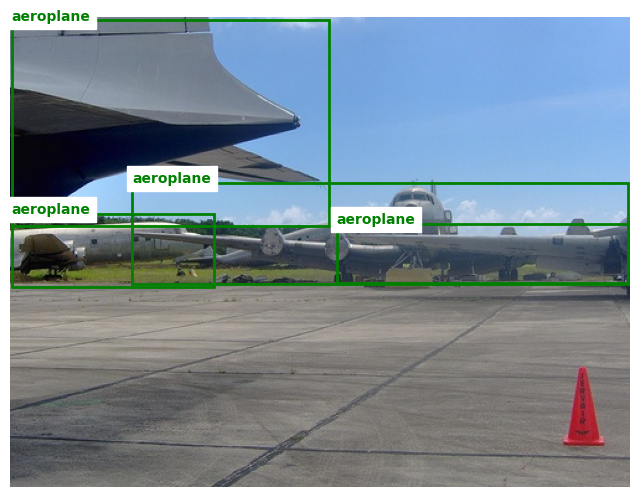

Image 2


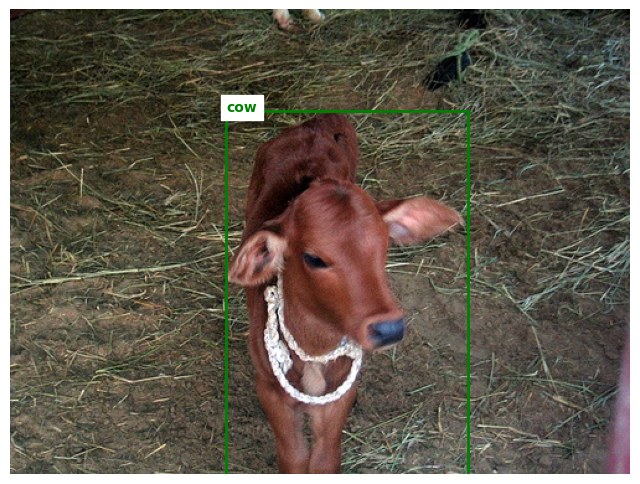

Image 3


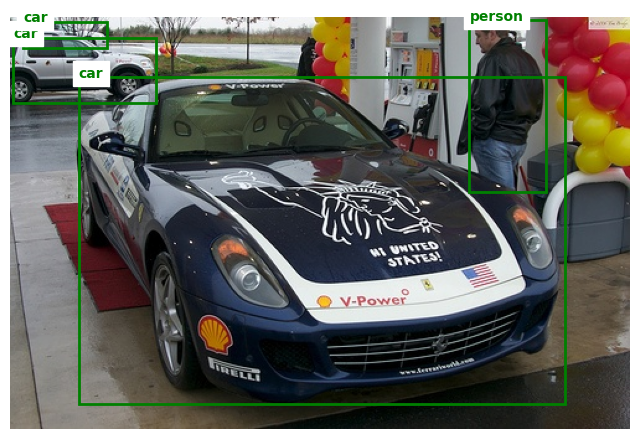

Image 4


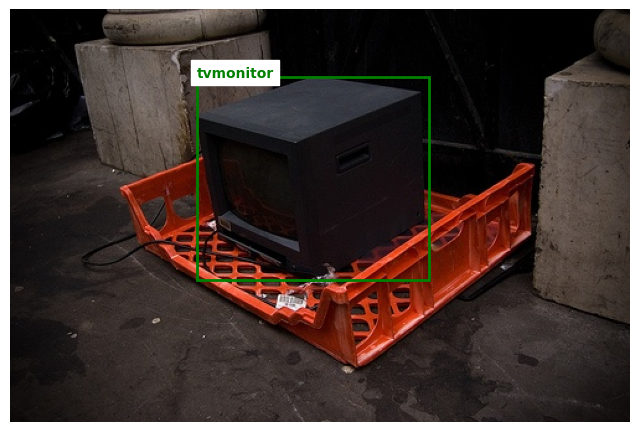

Image 5


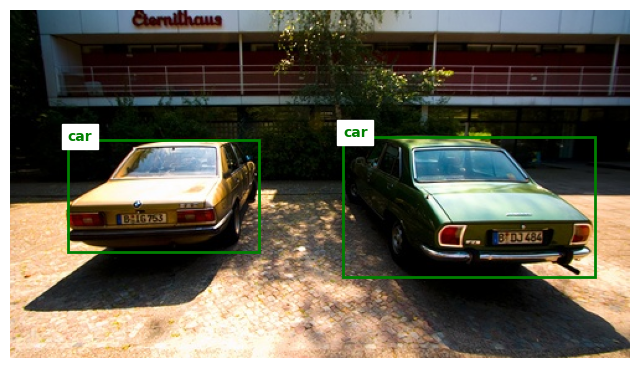

Image 6


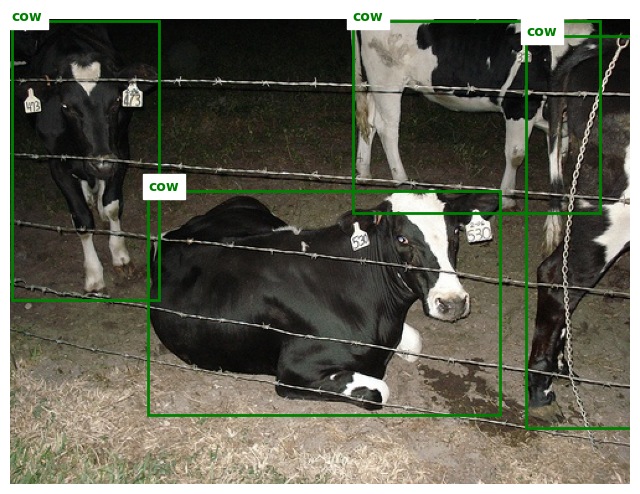

Image 7


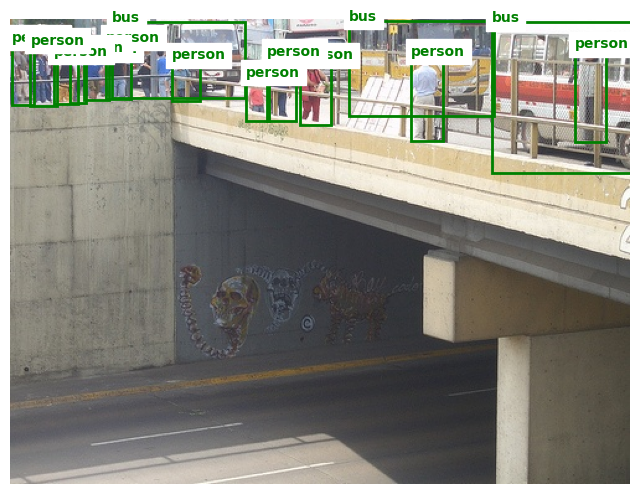

Image 8


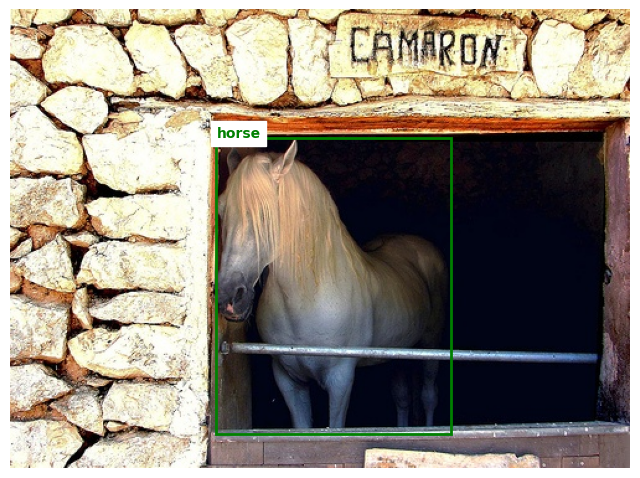

Image 9


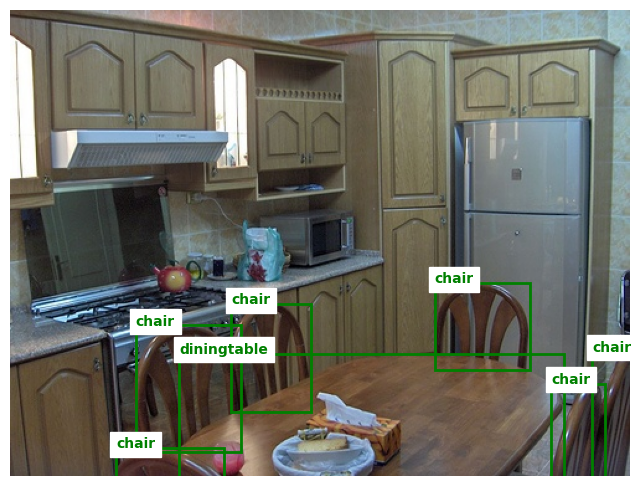

Image 10


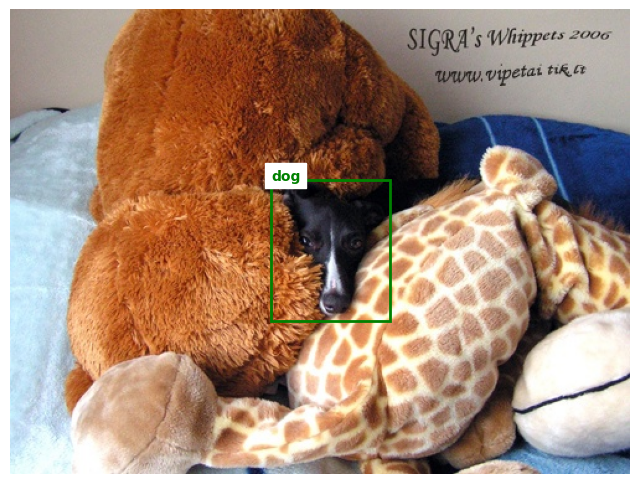

Image 11


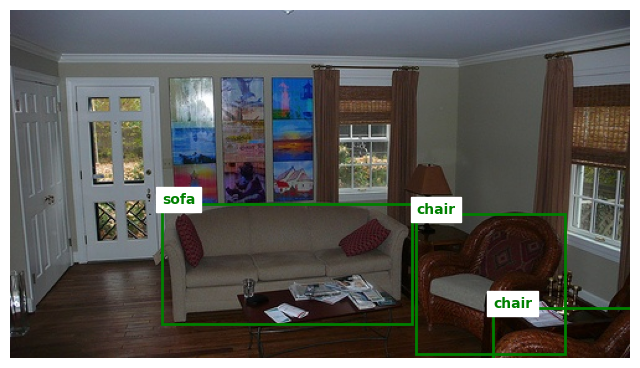

Image 12


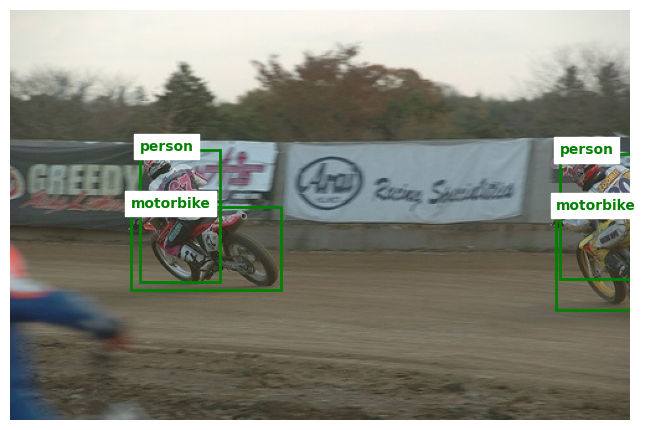

Image 13


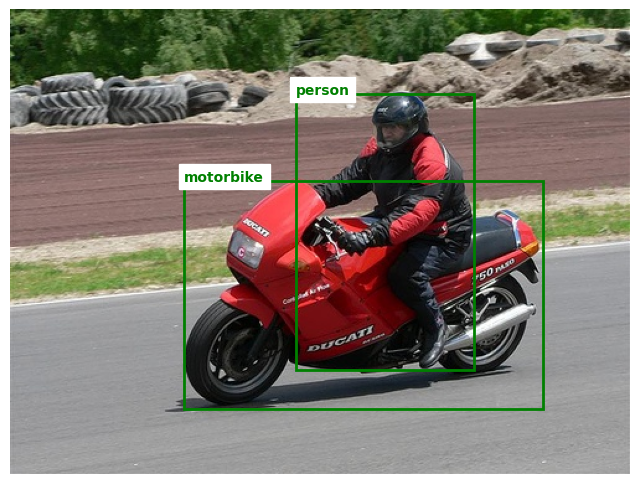

Image 14


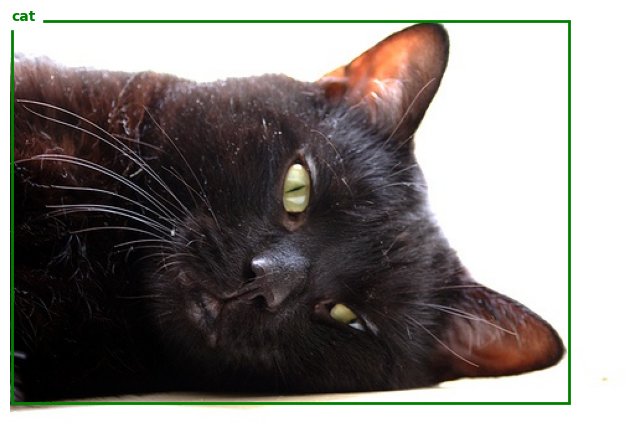

Image 15


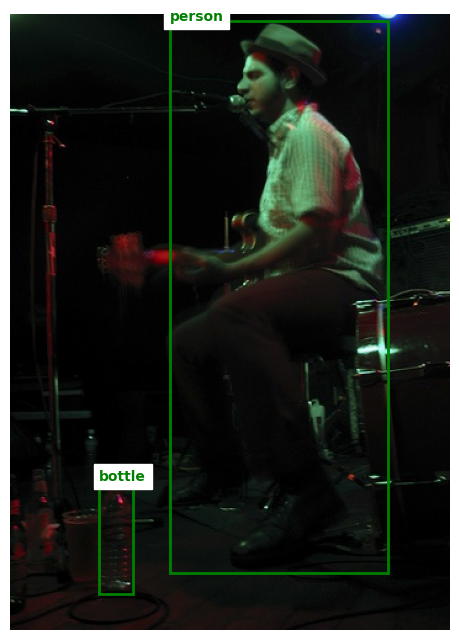

Image 16


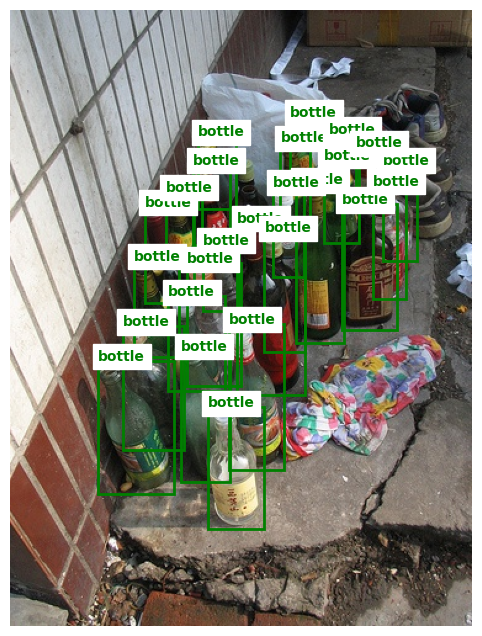

Image 17


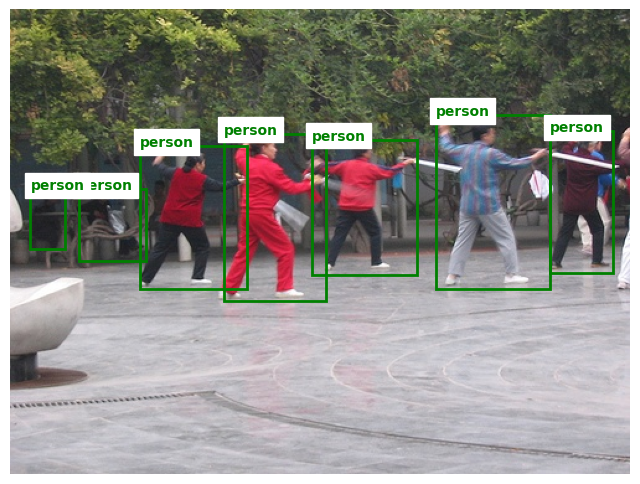

Image 18


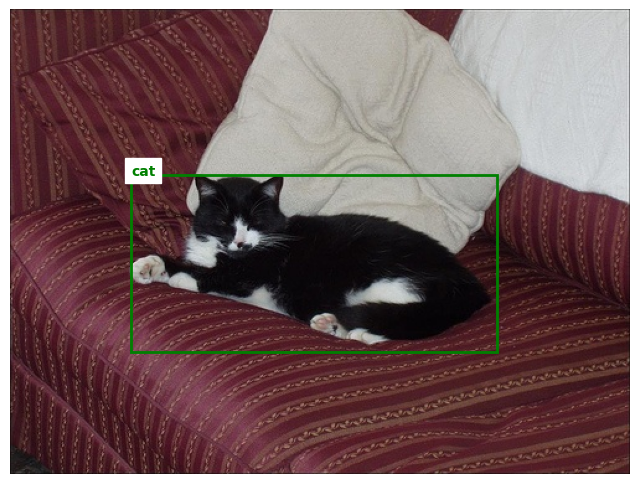

Image 19


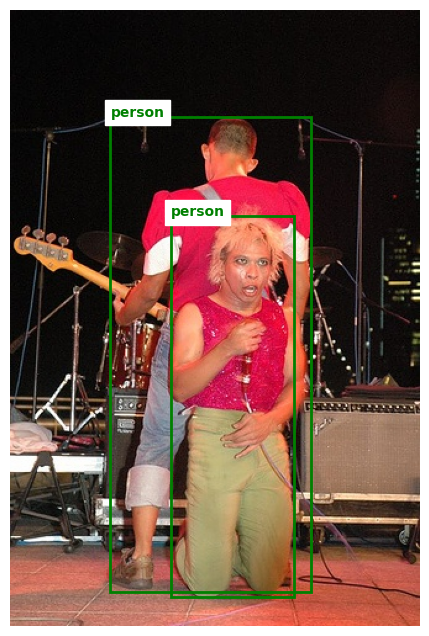

Image 20


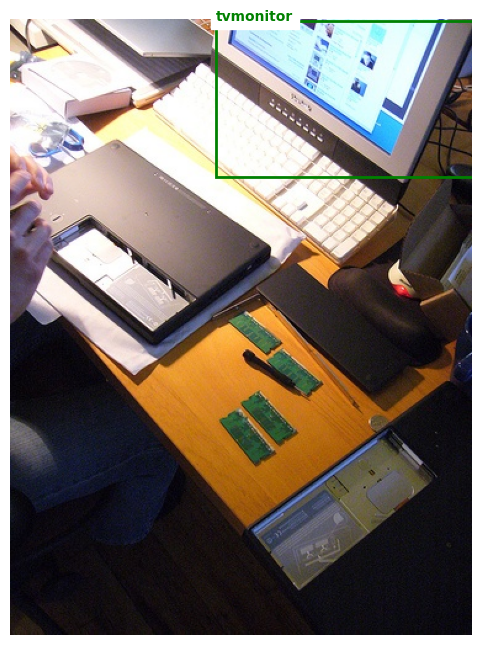

Image 21


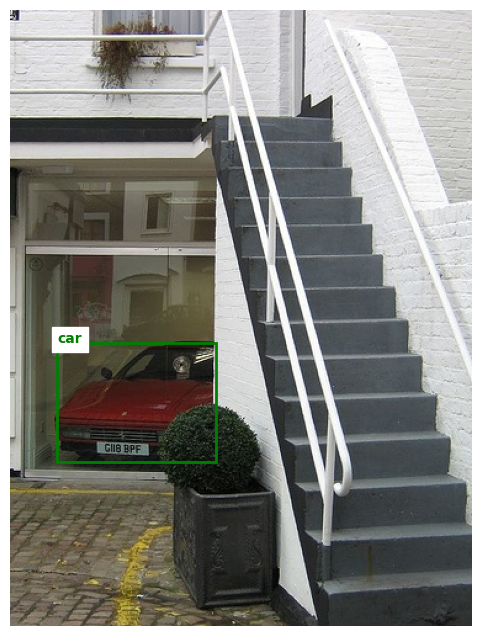

Image 22


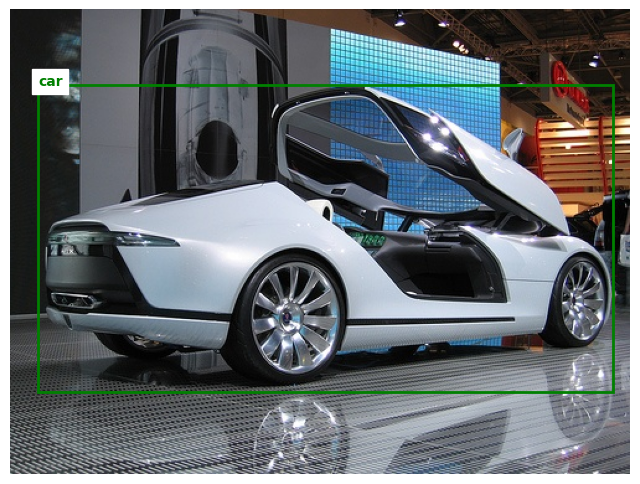

Image 23


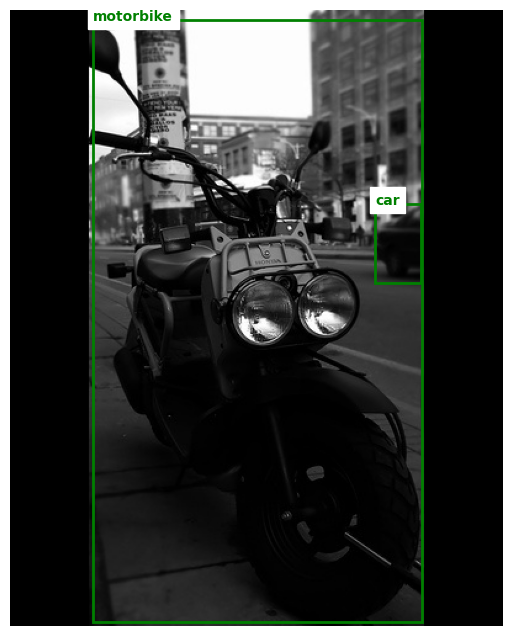

Image 24


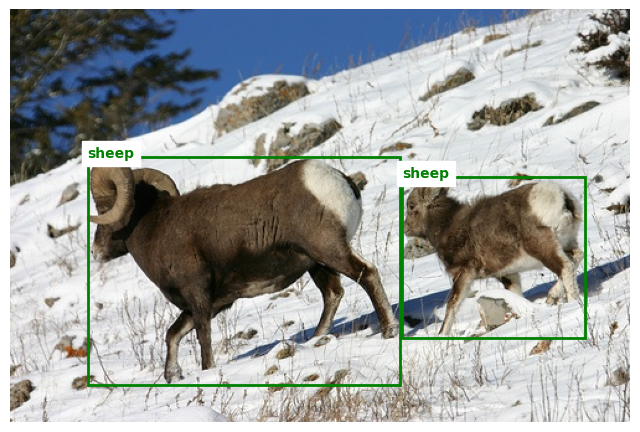

Image 25


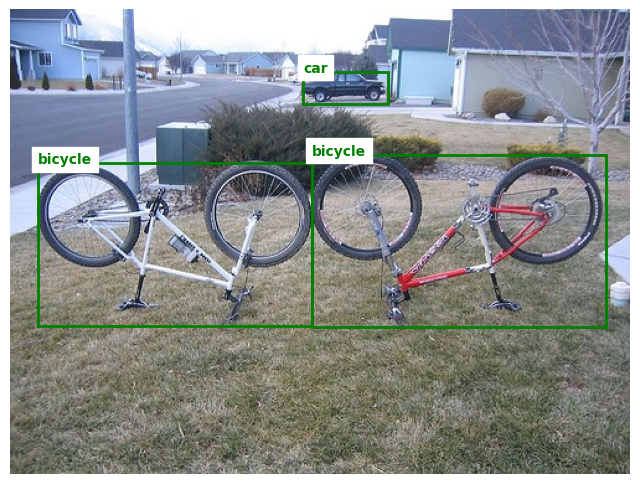

Image 26


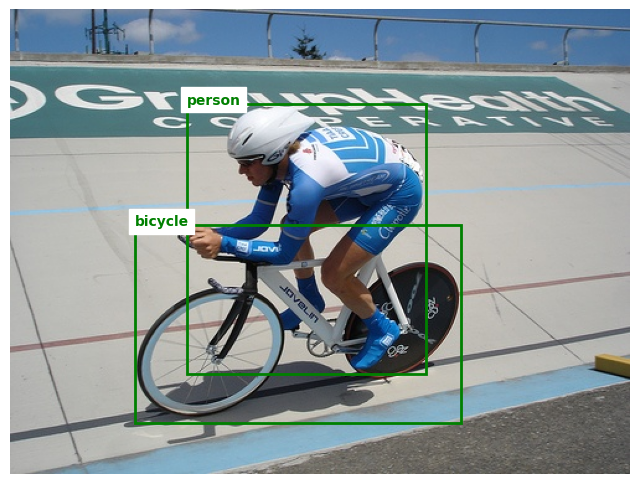

Image 27


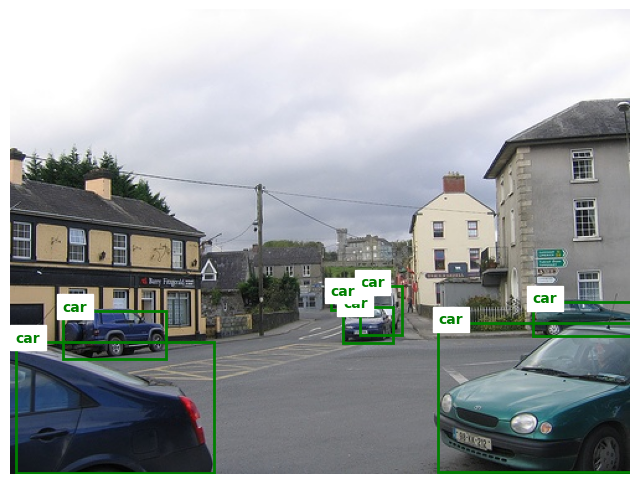

Image 28


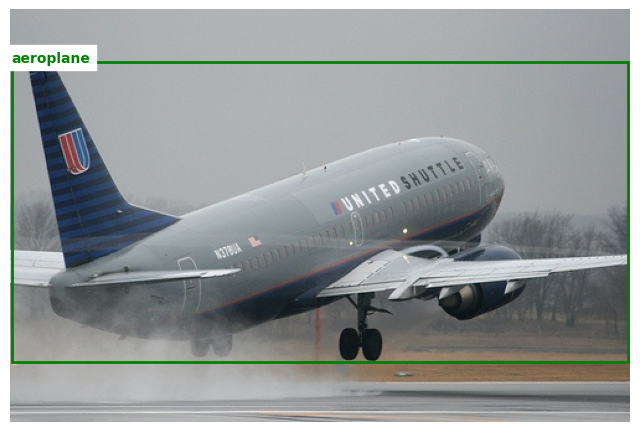

Image 29


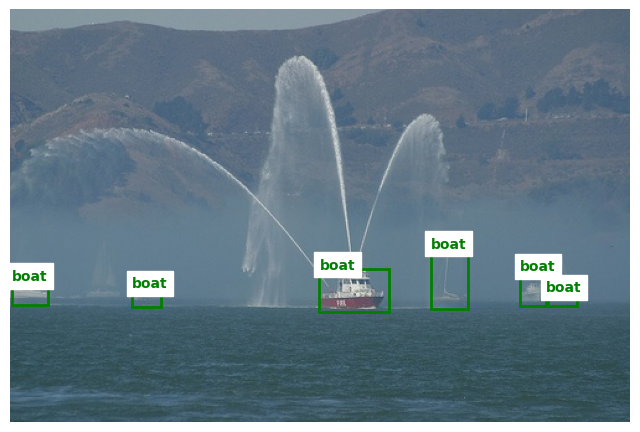

Image 30


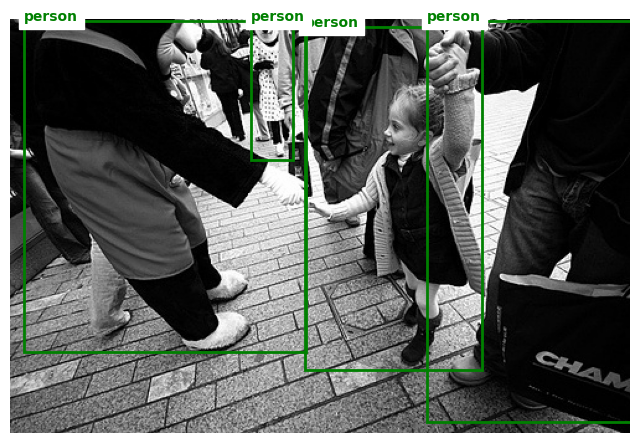

In [19]:
model.eval()
with torch.no_grad():
    for i in range(len(subset_dataset)):
        image, voc_target = subset_dataset[i]
        target = prepare_target(voc_target)
        image_device = image.to(device)
        prediction = model([image_device])[0]

        print(f"Image {i+1}")
        plot_image_with_boxes(image, target, prediction)



Training with LR = 0.005, Batch Size = 2
LR: 0.005, BS: 2 | Epoch 1/2 - Avg Loss: 1.3145
LR: 0.005, BS: 2 | Epoch 2/2 - Avg Loss: 0.9020

Training with LR = 0.005, Batch Size = 4
LR: 0.005, BS: 4 | Epoch 1/2 - Avg Loss: 1.7174
LR: 0.005, BS: 4 | Epoch 2/2 - Avg Loss: 0.9376

Training with LR = 0.001, Batch Size = 2
LR: 0.001, BS: 2 | Epoch 1/2 - Avg Loss: 1.6942
LR: 0.001, BS: 2 | Epoch 2/2 - Avg Loss: 0.9487

Training with LR = 0.001, Batch Size = 4
LR: 0.001, BS: 4 | Epoch 1/2 - Avg Loss: 2.0792
LR: 0.001, BS: 4 | Epoch 2/2 - Avg Loss: 1.2325


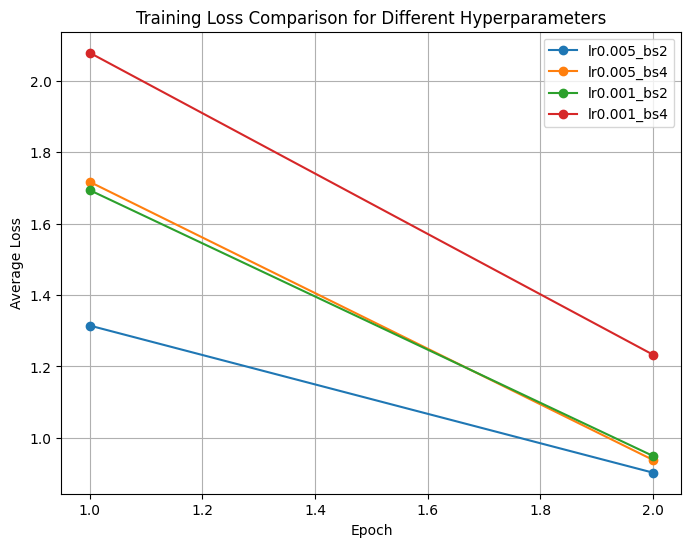

In [20]:
def train_model_with_losses(lr, bs, epochs=2):
    # Create a DataLoader for the given batch size
    dl = DataLoader(subset_dataset, batch_size=bs, shuffle=True, collate_fn=collate_fn)

    # Create a new model instance and adjust for 21 classes
    model_exp = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    in_features = model_exp.roi_heads.box_predictor.cls_score.in_features
    model_exp.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    model_exp.to(device)

    optimizer = torch.optim.SGD(model_exp.parameters(), lr=lr, momentum=0.9, weight_decay=0.0005)

    epoch_losses = []
    model_exp.train()
    for epoch in range(epochs):
        running_loss = 0.0
        num_batches = 0
        for images, targets in dl:
            images = [img.to(device) for img in images]
            targets = [prepare_target(t) for t in targets]
            for target in targets:
                target['boxes'] = target['boxes'].to(device)
                target['labels'] = target['labels'].to(device)

            loss_dict = model_exp(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()

            running_loss += losses.item()
            num_batches += 1

        avg_loss = running_loss / num_batches if num_batches > 0 else 0
        epoch_losses.append(avg_loss)
        print(f"LR: {lr}, BS: {bs} | Epoch {epoch+1}/{epochs} - Avg Loss: {avg_loss:.4f}")

    return model_exp, epoch_losses

# Define hyperparameter settings to experiment with
lr_list = [0.005, 0.001]
batch_sizes = [2, 4]

results = {}
trained_models = {}

for lr in lr_list:
    for bs in batch_sizes:
        print(f"\nTraining with LR = {lr}, Batch Size = {bs}")
        model_exp, losses = train_model_with_losses(lr, bs, epochs=2)
        key = f"lr{lr}_bs{bs}"
        results[key] = losses
        trained_models[key] = model_exp

# Plot the loss curves for each hyperparameter combination
plt.figure(figsize=(8, 6))
for key, losses in results.items():
    epochs = list(range(1, len(losses) + 1))
    plt.plot(epochs, losses, marker='o', label=key)

plt.xlabel("Epoch")
plt.ylabel("Average Loss")
plt.title("Training Loss Comparison for Different Hyperparameters")
plt.legend()
plt.grid(True)
plt.show()
